# Data Augmentation through Synthetic Data with Waffle Syrup

- When the amount of data is insufficient, even if the accuracy is high, the model's performance may appear poor to humans. One way to address this issue is through data augmentation using synthetic data. This tutorial shows the process of generating synthetic data by creating masks and eventually generating the synthetic data.

## Load Your Data

In [1]:
!ls datasets/flame_coco

coco.json  images


In [2]:
from pathlib import Path
import random
import shutil
import PIL.Image

from waffle_utils.file.search import get_image_files
from waffle_hub.dataset.dataset import Dataset
from waffle_hub import TaskType

random.seed(0)

/home/cys/anaconda3/envs/waffle/lib/python3.9/site-packages/waffle_hub/__init__.py:16: UserWarning: 
            torch 1.13.1+cu117 has not been tested.
            We recommend you to use one of ['1.13.1']
            
  warnings.warn(


In [3]:
shutil.rmtree("datasets/flame", ignore_errors=True)
ds = Dataset.from_coco(
    name="flame",
    task=TaskType.OBJECT_DETECTION,
    coco_file="datasets/flame_coco/coco.json",
    coco_root_dir="datasets/flame_coco/images",
)

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


Importing coco dataset: 100%|██████████| 1000/1000 [00:00<00:00, 5243.25it/s]


In [4]:
def display_images(images):
    images = [PIL.Image.open(image) for image in images]
    widths, heights = zip(*(i.size for i in images))
    total_width = sum(widths)
    max_height = max(heights)
    new_im = PIL.Image.new("RGB", (total_width, max_height))
    x_offset = 0
    for im in images:
        new_im.paste(im, (x_offset, 0))
        x_offset += im.size[0]
    return new_im

In [5]:
image_paths = get_image_files(ds.raw_image_dir)
random.shuffle(image_paths)
image_paths = list(map(str, image_paths[:5]))
print(image_paths)

['datasets/flame/raw/C054105_002/000675.jpg', 'datasets/flame/raw/C055105_001/000140.jpg', 'datasets/flame/raw/C050205_002/000140.jpg', 'datasets/flame/raw/C054305_002/000100.jpg', 'datasets/flame/raw/C051205_001/000055.jpg']


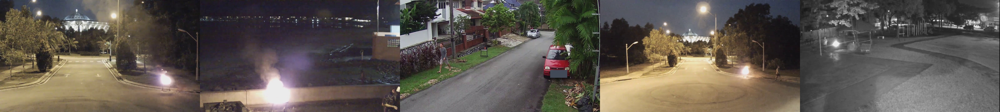

In [6]:
display_images(image_paths)

## Create Mask

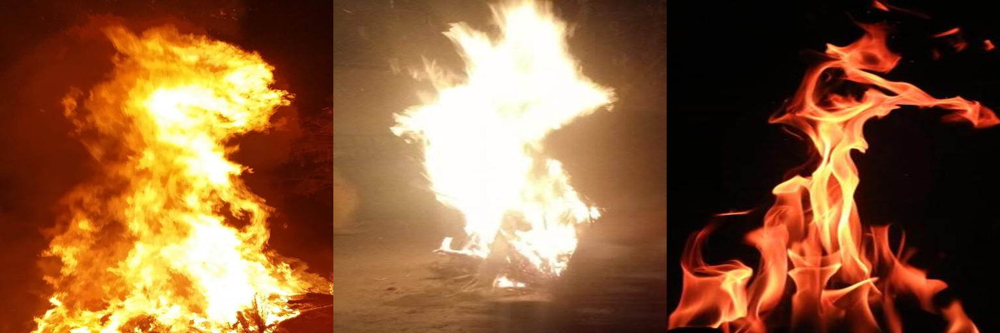

In [7]:
source_image_paths = get_image_files("images/sample/source")
display_images(source_image_paths)

In [8]:
from waffle_syrup.data.mask_creator import DichotomousImageSegmentation as DIS

shutil.rmtree("images/sample/mask", ignore_errors=True)
mask_creator = DIS(
    image_dir="images/sample/source",
    result_dir="images/sample/mask",
    image_size=1024,
    device="1",
    batch_size=2,
)
mask_creator.create()

/home/cys/anaconda3/envs/waffle/lib/python3.9/site-packages/torch/nn/_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='mean' instead.
  warnings.warn(warning.format(ret))


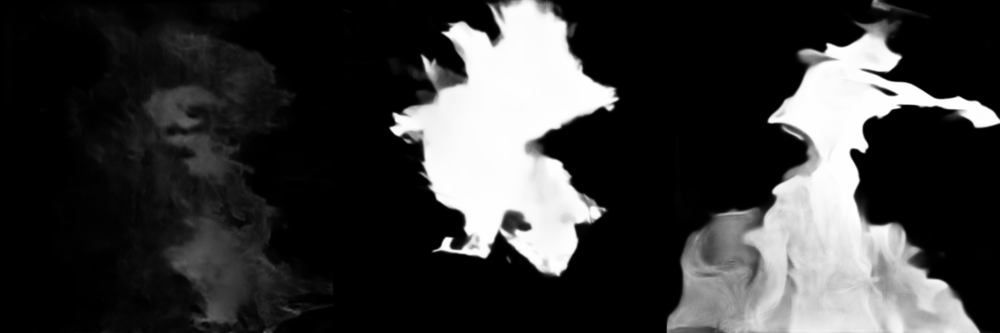

In [9]:
mask_image_paths = get_image_files("images/sample/mask")
display_images(mask_image_paths)

## Image Synthetic

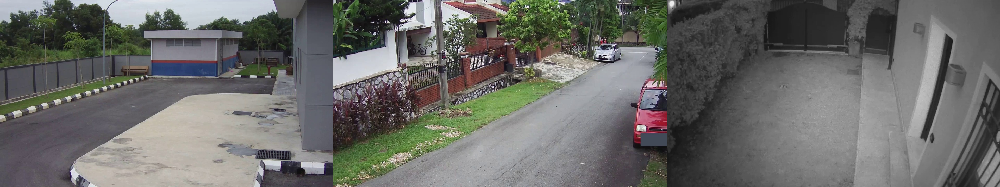

In [10]:
target_image_paths = get_image_files("images/sample/target")
display_images(target_image_paths)

In [11]:
from waffle_syrup.tools.image_dataset_handler import generate_synthetic_images
from waffle_syrup.data.image_options import ImageMerge

shutil.rmtree("images/sample/result/poisson", ignore_errors=True)
generate_synthetic_images(
    target_dir='images/sample/target',
    source_dir='images/sample/source',
    mask_dir='images/sample/mask',
    result_dir='images/sample/result/poisson',
    result_resolution=(1024, 1024),
    mask_threshold=5,
    result_per_pair=1,
    merge_opt=ImageMerge.POISSON_IMAGE_EDIT,
    seed=0
)

Generated: 1.jpg
Progress: 1/9
Generated: 2.jpg
Progress: 2/9
Generated: 3.jpg
Progress: 3/9
Generated: 4.jpg
Progress: 4/9
Generated: 5.jpg
Progress: 5/9
Generated: 6.jpg
Progress: 6/9
Generated: 7.jpg
Progress: 7/9
Generated: 8.jpg
Progress: 8/9
Generated: 9.jpg
Progress: 9/9
---Image Synthesis Done---
Image information in: images/sample/result/poisson/coco.json


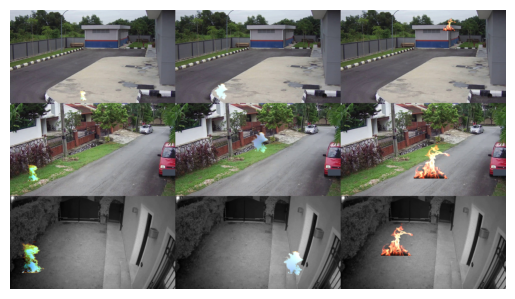

In [18]:
import matplotlib.pyplot as plt
import numpy as np

result_image_paths = get_image_files("images/sample/result/poisson")
image = None
for i in range(0,len(result_image_paths),len(target_image_paths)):
    raw_image = display_images(result_image_paths[i:i+len(target_image_paths)])
    if image is not None:
        image = np.concatenate((image, raw_image), axis=0)
    else:
        image = raw_image
plt.axis("off")
plt.imshow(image)